#**Project 2: Clustering and Dimensionality Reduction using EM Algorithm and Autoencoders**

## **Introduction <a name="Introduction"></a>**
The goal of this project is to investigate scenarios where the relationship between features is non-linear or data contains multiple clusters, each exhibiting different feature relationships. We develop a method for combining multiple Principal Component Analyses (PCAs) using the Expectation-Maximization (EM) algorithm. Additionally, we introduce constraints to an Autoencoder neural network to mimic PCA. This project involves the use of Python and PyTorch with simulated data.

## **Dataset Overview <a name="Introduction"></a>**


The dataset used in this project is the **Vehicle Silhouettes dataset**. This dataset contains various geometric features of different vehicles, which are used to distinguish between different classes of vehicles. Here is a detailed overview of the dataset:

Features
* COMPACTNESS: A measure of how closely the shape of the vehicle resembles a circle.
* CIRCULARITY: Another measure of circularity, calculated differently from COMPACTNESS.
* 'DISTANCE CIRCULARITY': The average distance of points on the perimeter from the center.
* 'RADIUS RATIO': The ratio of the radii of the vehicle's shape.
* 'PR.AXIS ASPECT RATIO': The aspect ratio of the principal axis.
* 'MAX.LENGTH ASPECT RATIO': The aspect ratio of the maximum length.
* 'SCATTER RATIO': A measure of how scattered the points are around the vehicle's perimeter.
* ELONGATEDNESS: A measure of how elongated the vehicle's shape is.
* 'PR.AXIS RECTANGULARITY': Rectangularity measure based on the principal axis.
* 'MAX.LENGTH RECTANGULARITY': Rectangularity measure based on the maximum length.
* 'SCALED VARIANCE_MAJOR': Scaled variance along the major axis.
* 'SCALED VARIANCE_MINOR': Scaled variance along the minor axis.
* 'SCALED RADIUS OF GYRATION': Scaled measure of how points are distributed around the vehicle's center.
* 'SKEWNESS ABOUT_MAJOR': Skewness of the distribution along the major axis.
* 'SKEWNESS ABOUT_MINOR': Skewness of the distribution along the minor axis.
* 'KURTOSIS ABOUT_MAJOR': Kurtosis of the distribution along the major axis.
* 'KURTOSIS ABOUT_MINOR': Kurtosis of the distribution along the minor axis.
* 'HOLLOWS RATIO': A measure related to the hollowness of the vehicle's shape.

In [ ]:
   from google.colab import drive

   drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA, KernelPCA
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
from scipy.stats import multivariate_normal
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score, davies_bouldin_score
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import mean_squared_error
import scipy.stats as stats

##**Data Preprocessing**


Data preprocessing is a crucial step in preparing the dataset for analysis. It involves cleaning the data, transforming it into a suitable format, and ensuring that all features contribute equally to the analysis. In this project, the Vehicle Silhouettes dataset is preprocessed to facilitate effective clustering and dimensionality reduction using the Expectation-Maximization (EM) algorithm and autoencoders.
- **Steps for Data Preprocessing**
1. **Loading the Dataset**: The dataset is loaded into a Pandas DataFrame for easy
manipulation and analysis.
2. **Handling Missing Values**: The dataset is checked for any missing values and appropriate measures are taken if any are found.
3. **Encoding the Target Variable**: The categorical target variable ('Class') is encoded into numerical values.
4. **Feature Standardization**: The features are standardized to have a mean of 0 and a standard deviation of 1.

In [ ]:
# Load the dataset
file_path = '/content/drive/MyDrive/Colab Notebooks/vehicle.csv'
vehicle_data = pd.read_csv(file_path)
print(vehicle_data.head())

   COMPACTNESS  CIRCULARITY  'DISTANCE CIRCULARITY'  'RADIUS RATIO'  \
0           95           48                      83             178   
1           91           41                      84             141   
2          104           50                     106             209   
3           93           41                      82             159   
4           85           44                      70             205   

   'PR.AXIS ASPECT RATIO'  'MAX.LENGTH ASPECT RATIO'  'SCATTER RATIO'  \
0                      72                         10              162   
1                      57                          9              149   
2                      66                         10              207   
3                      63                          9              144   
4                     103                         52              149   

   ELONGATEDNESS  'PR.AXIS RECTANGULARITY'  'MAX.LENGTH RECTANGULARITY'  \
0             42                        20                 

In [ ]:
# Check for missing values
missing_values = vehicle_data.isnull().sum()
print("Missing Values:\n", missing_values)

Missing Values:
 COMPACTNESS                    0
CIRCULARITY                    0
'DISTANCE CIRCULARITY'         0
'RADIUS RATIO'                 0
'PR.AXIS ASPECT RATIO'         0
'MAX.LENGTH ASPECT RATIO'      0
'SCATTER RATIO'                0
ELONGATEDNESS                  0
'PR.AXIS RECTANGULARITY'       0
'MAX.LENGTH RECTANGULARITY'    0
'SCALED VARIANCE_MAJOR'        0
'SCALED VARIANCE_MINOR'        0
'SCALED RADIUS OF GYRATION'    0
'SKEWNESS ABOUT_MAJOR'         0
'SKEWNESS ABOUT_MINOR'         0
'KURTOSIS ABOUT_MAJOR'         0
'KURTOSIS ABOUT_MINOR'         0
'HOLLOWS RATIO'                0
Class                          0
dtype: int64


In [ ]:
# Convert categorical variables to numerical
if 'Class' in vehicle_data.columns:
    vehicle_data['Class'] = vehicle_data['Class'].astype('category').cat.codes

print (vehicle_data['Class'].head())

0    3
1    3
2    2
3    3
4    0
Name: Class, dtype: int8


In [ ]:
# Feature Scaling
scaler = StandardScaler()
scaled_features = scaler.fit_transform(vehicle_data.drop('Class', axis=1))
scaled_data = pd.DataFrame(scaled_features, columns=vehicle_data.columns[:-1])
scaled_data['Class'] = vehicle_data['Class']

In [ ]:
# Map clusters to merge specific clusters
class_mapping = {0: 0, 1: 1, 2: 1, 3: 2}  # Merging clusters 1 and 2
scaled_data['Merged_Class'] = scaled_data['Class'].map(class_mapping)

# Drop the original 'Class' column as it's no longer needed
scaled_data = scaled_data.drop('Class', axis=1, errors='ignore')

## **Dataset Analysis**


In this section, we perform a comprehensive analysis of the Vehicle Silhouettes dataset. This analysis includes visualizing the distribution of the target variable, exploring the distributions of individual features, checking for normality, examining feature correlations, and visualizing pairwise relationships between features.


#### **Data Analysis Steps**
* **Distribution of Target Variable ('Merged_Class'):** Visualize the distribution of the target variable to understand the class balance.
* **Feature Distributions:** Plot histograms for each feature to explore their distributions.
* **Normality Check:** Use Q-Q plots to assess the normality of each feature.
* **Correlation Analysis:** Create a correlation heatmap to examine the relationships between features.
* **Pairwise Relationships:** Use pairplots to visualize relationships between features and the target variable.

#### **Reasons for Data Analysis**
* **Class Balance:** Understanding the distribution of the target variable helps in ensuring that the dataset is balanced. A balanced dataset prevents the model from being biased towards the majority class and ensures good performance across all classes.
* **Feature Distribution:** Plotting histograms helps to understand the range, central tendency, and spread of features. This helps in identifying any skewness or outliers that might need to be addressed.
* **Normality Check:** Q-Q plots are used to check if the features follow a normal distribution. This is important because many statistical models, including the EM algorithm, assume normality. Ensuring that this assumption holds true helps in building more accurate models.
* **Correlation Analysis:** Examining correlations between features helps in identifying highly correlated features. This information is useful for feature selection and dimensionality reduction, preventing issues related to multicollinearity.
* **Non-Linear Relationships:** Visualizing pairwise relationships between features and the target variable helps in detecting non-linear relationships. This is crucial for understanding how features interact and ensuring that the EM algorithm and PCA models can effectively capture these relationships.

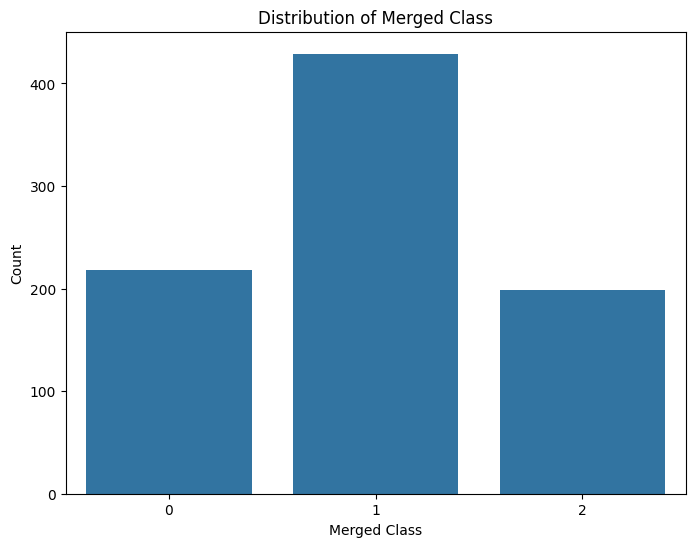

In [ ]:
# Visualize the distribution of 'Merged_Class'
plt.figure(figsize=(8, 6))
sns.countplot(x='Merged_Class', data=scaled_data)
plt.title('Distribution of Merged Class')
plt.xlabel('Merged Class')
plt.ylabel('Count')
plt.show()

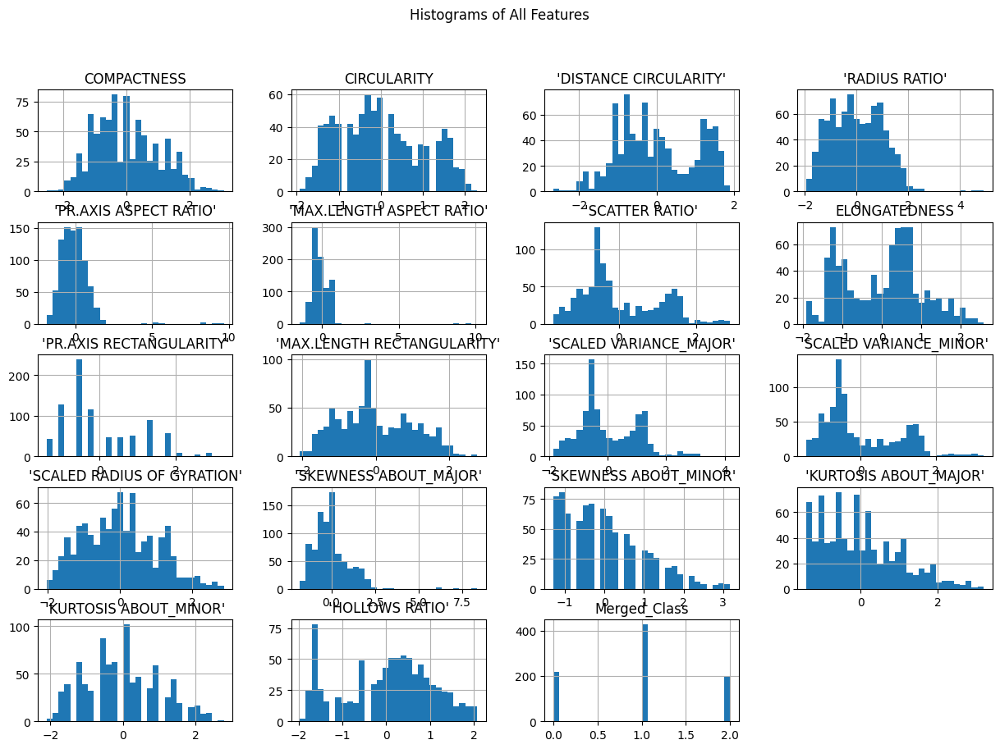

In [ ]:
# Plot histograms for each feature
scaled_data.hist(bins=30, figsize=(15, 10))
plt.suptitle('Histograms of All Features')
plt.show()

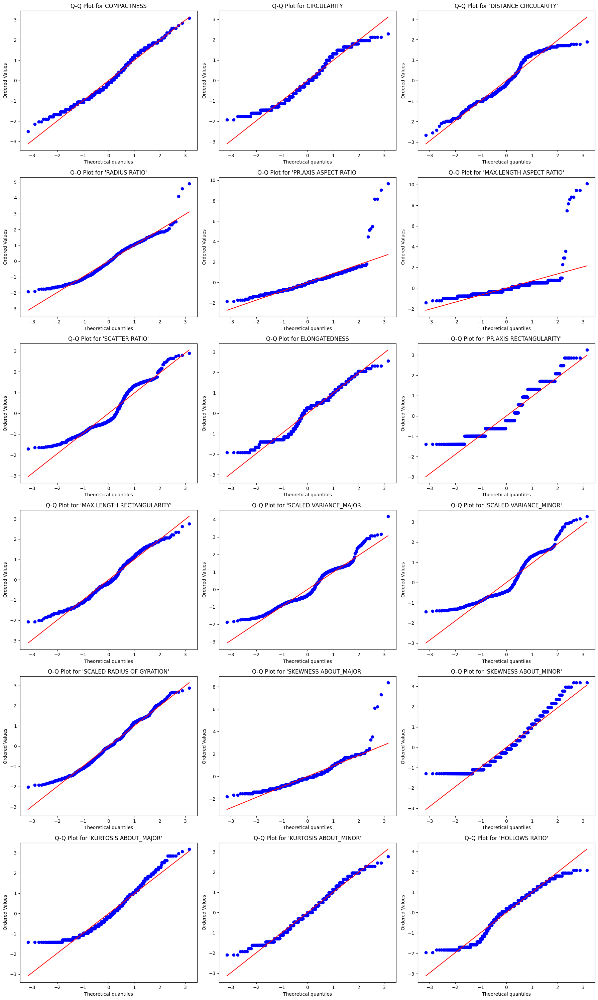

In [ ]:
def plot_qq_grid(data, features, cols=3):
    rows = (len(features) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 6, rows * 5))
    axes = axes.flatten()
    for i, feature in enumerate(features):
        stats.probplot(data[feature], dist="norm", plot=axes[i])
        axes[i].set_title(f'Q-Q Plot for {feature}')
    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    plt.tight_layout()
    plt.show()

# List of features excluding 'Merged_Class'
features = [col for col in scaled_data.columns if col != 'Merged_Class']

# Plot Q-Q plots in a grid
plot_qq_grid(scaled_data, features, cols=3)

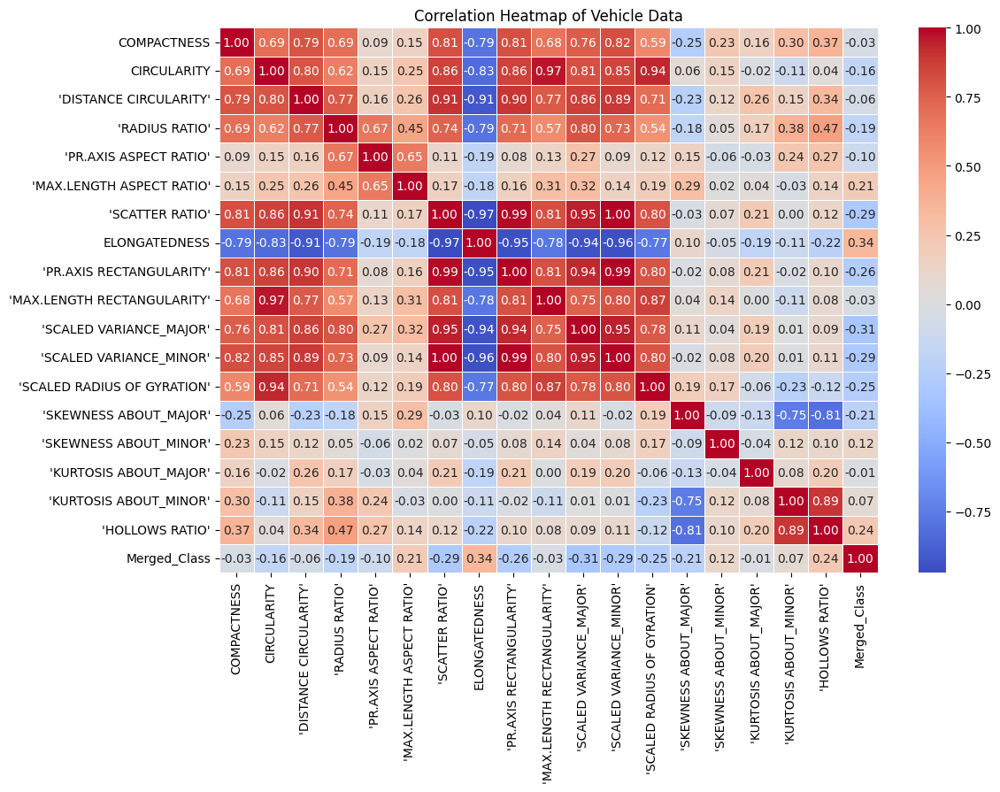

In [ ]:
# Correlation heatmap
plt.figure(figsize=(12, 8))
corr_matrix = scaled_data.corr()
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of Vehicle Data')
plt.show()

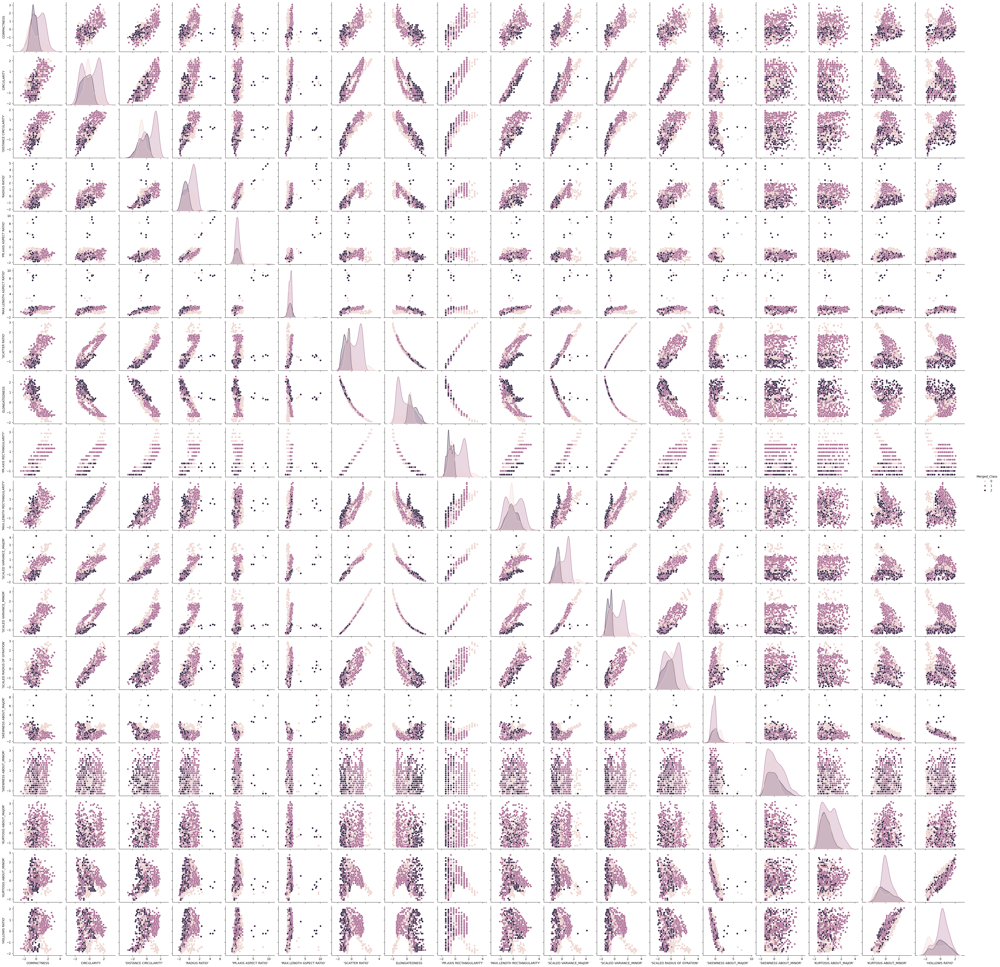

In [ ]:
# Pairplot to visualize relationships between features and 'Merged_Class'
sns.pairplot(scaled_data, hue='Merged_Class', diag_kind='kde')
plt.show()

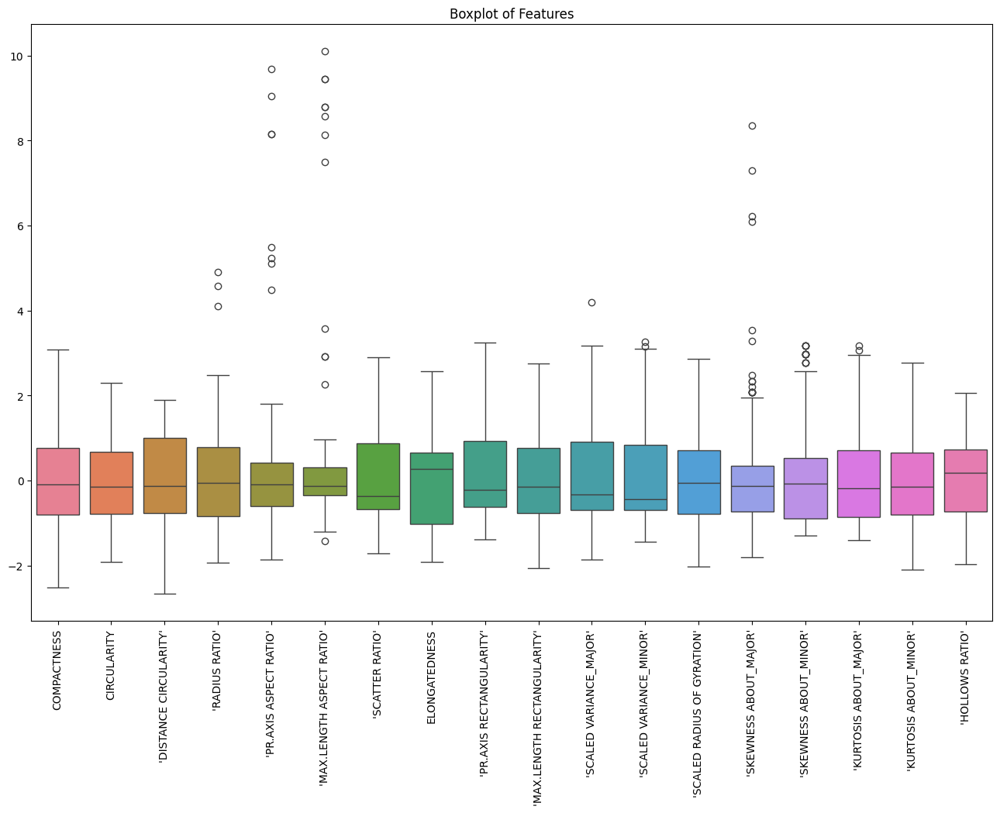

In [ ]:
# Boxplot to check for outliers in the features
plt.figure(figsize=(16, 10))
sns.boxplot(data=scaled_data.drop('Merged_Class', axis=1))
plt.xticks(rotation=90)
plt.title('Boxplot of Features')
plt.show()

#### **Characteristics of the Dataset**
* **Numerical Features:** All features are numerical, representing various geometric properties of vehicle silhouettes.
* **Categorical Target:** The target variable is categorical, indicating the class of each vehicle.
* **No Missing Values:** The dataset does not contain any missing values.
* **Multivariate Data:** The dataset is multivariate, with multiple features contributing to the classification of vehicles.
Standardized Features: Features have been standardized to have a mean of 0 and a standard deviation of 1.
* **Feature Distributions:** The histograms show varied distributions for different features, with some appearing normally distributed and others not. Q-Q plots reveal that not all features follow a normal distribution.
* **Correlation:** Some features are highly correlated, which is useful information for dimensionality reduction techniques.

## **Method for combining multiple PCAs for this scenario using the EM algorithm**

### Introduction to PCA and Kernel PCA

**1. Principal Component Analysis (PCA)**

PCA is a linear dimensionality reduction technique that transforms data into a set of orthogonal components, ordered by the amount of variance they capture. The steps involved in PCA are:
- **Standardization**: Center and scale the data.
- **Covariance Matrix Computation**: Calculate the covariance matrix to understand relationships between features.
- **Eigenvalue and Eigenvector Decomposition**: Solve for eigenvalues and eigenvectors to identify principal components.
- **Projection**: Transform the data onto the new set of orthogonal axes defined by the principal components.


**2. Kernel Principal Component Analysis (Kernel PCA)**

Kernel PCA extends traditional PCA to handle nonlinear relationships by mapping data into a higher-dimensional space using kernel functions. Common kernels include polynomial, Gaussian (RBF), and sigmoid. The algorithm involves:
- **Kernel Matrix Computation**: Calculate the kernel matrix representing the data in a higher-dimensional space.
- **Centering the Kernel Matrix**: Ensure the data is centered in the new feature space.
- **Eigenvalue Decomposition:** Perform eigenvalue decomposition on the centered kernel matrix.
- **Projection**:Project the original data onto the principal components in the higher-dimensional space.
Kernel PCA is particularly useful for datasets with complex, nonlinear structures.




The following code demonstrates the application of PCA and Kernel PCA on a scaled vehicle dataset with a 'Merged_Class' feature indicating clusters. We reduced the dimensionality to three components for both methods and visualized the first two principal components.

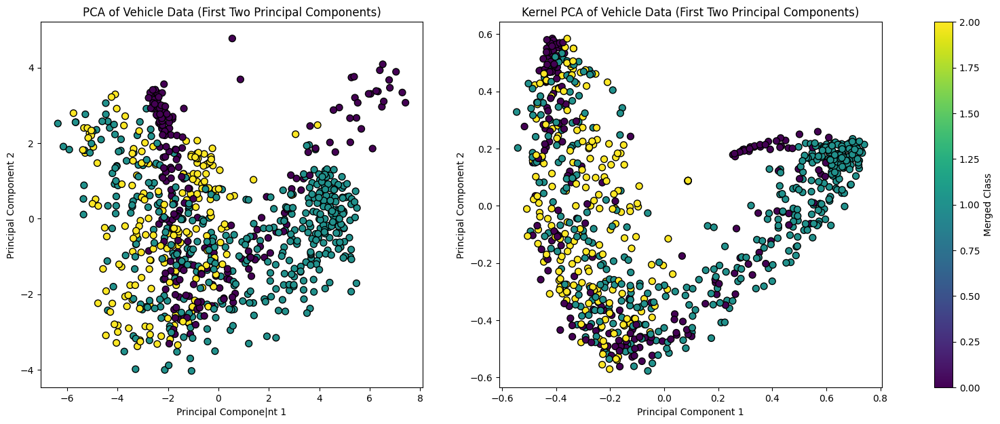

Explained Variance Ratio for PCA (2 components): 0.6917
Explained Variance Ratio for PCA (3 components): 0.7972
Reconstruction Error for Kernel PCA: 0.3302


In [ ]:
# Perform PCA on the scaled data with 3 components
pca = PCA(n_components=3)
X_pca = pca.fit_transform(scaled_data.drop('Merged_Class', axis=1))

# Perform Kernel PCA on the scaled data with 3 components
kpca = KernelPCA(n_components=3, kernel='rbf', fit_inverse_transform=True)
X_kpca = kpca.fit_transform(scaled_data.drop('Merged_Class', axis=1))

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 7))

# Plot the PCA results with merged clusters (2D plot)
axes[0].scatter(X_pca[:, 0], X_pca[:, 1], c=scaled_data['Merged_Class'], cmap='viridis', edgecolor='k', s=50)
axes[0].set_title('PCA of Vehicle Data (First Two Principal Components)')
axes[0].set_xlabel('Principal Compone|nt 1')
axes[0].set_ylabel('Principal Component 2')

# Plot the Kernel PCA results with merged clusters (2D plot)
axes[1].scatter(X_kpca[:, 0], X_kpca[:, 1], c=scaled_data['Merged_Class'], cmap='viridis', edgecolor='k', s=50)
axes[1].set_title('Kernel PCA of Vehicle Data (First Two Principal Components)')
axes[1].set_xlabel('Principal Component 1')
axes[1].set_ylabel('Principal Component 2')

# Add colorbar
fig.colorbar(axes[0].collections[0], ax=axes, orientation='vertical', label='Merged Class')

plt.show()
# Print explained variance for PCA components
explained_variance_ratio = pca.explained_variance_ratio_
print(f"Explained Variance Ratio for PCA (2 components): {explained_variance_ratio[:2].sum():.4f}")
print(f"Explained Variance Ratio for PCA (3 components): {explained_variance_ratio[:3].sum():.4f}")
# Calculate the reconstruction error for Kernel PCA
X_kpca_reconstructed = kpca.inverse_transform(X_kpca)
reconstruction_error = mean_squared_error(scaled_data.drop('Merged_Class', axis=1), X_kpca_reconstructed)
print(f"Reconstruction Error for Kernel PCA: {reconstruction_error:.4f}")

The visualizations with 3D scatter plots for the first three principal components of PCA and Kernel PCA applied to the vehicle data.

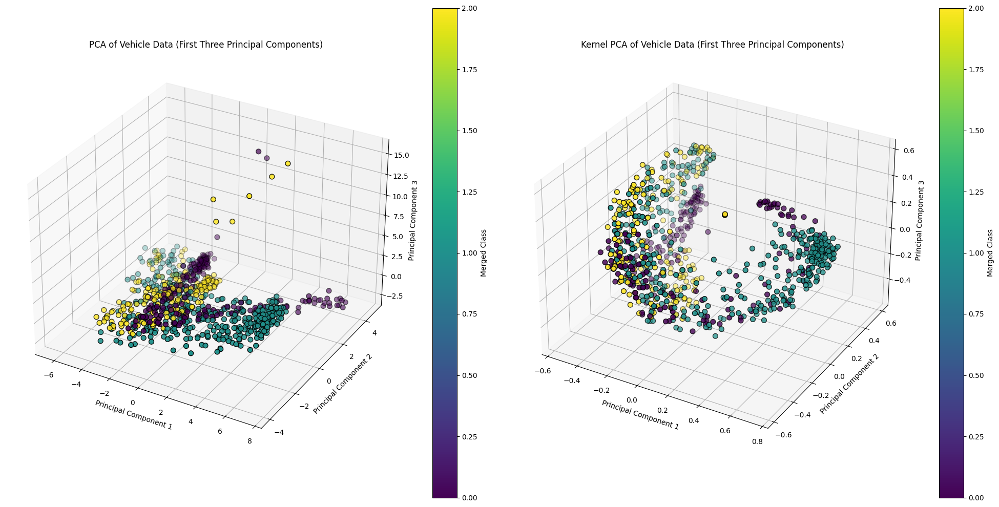

In [ ]:
# Create subplots for 3D plots
fig, axes = plt.subplots(1, 2, figsize=(20, 10), subplot_kw={'projection': '3d'})

# 3D Plot for the first three principal components - PCA
sc = axes[0].scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=scaled_data['Merged_Class'], cmap='viridis', edgecolor='k', s=50)
fig.colorbar(sc, ax=axes[0], label='Merged Class')
axes[0].set_title('PCA of Vehicle Data (First Three Principal Components)')
axes[0].set_xlabel('Principal Component 1')
axes[0].set_ylabel('Principal Component 2')
axes[0].set_zlabel('Principal Component 3')

# 3D Plot for the first three kernel principal components - Kernel PCA
sc = axes[1].scatter(X_kpca[:, 0], X_kpca[:, 1], X_kpca[:, 2], c=scaled_data['Merged_Class'], cmap='viridis', edgecolor='k', s=50)
fig.colorbar(sc, ax=axes[1], label='Merged Class')
axes[1].set_title('Kernel PCA of Vehicle Data (First Three Principal Components)')
axes[1].set_xlabel('Principal Component 1')
axes[1].set_ylabel('Principal Component 2')
axes[1].set_zlabel('Principal Component 3')

plt.tight_layout()
plt.show()

## Introduction to The Expectation Maximization Algorithm (EM)


The EM algorithm is used for obtaining maximum likelihood estimates of parameters when some of the data is missing. More generally, however, the EM algorithm can also be applied when there is latent, i.e. unobserved,
data which was never intended to be observed in the first place.



#### Theoretical Foundations


The EM algorithm is an efficient iterative procedure to compute the Maximum
Likelihood (ML) estimate in the presence of missing or hidden data.
Each iteration of the EM algorithm consists of two processes: The **E-step**,
and the **M-step**.
  - In the Expectation Step (E-step), the algorithm calculates the expected value of the log-likelihood function, considering the current estimates of the parameters and the hidden variables. This involves computing the posterior distribution of the hidden variables given the observed data and the current parameter estimates.
  - In the Maximization Step (M-Step), the likelihood function is maximized under the assumption that the missing data are known. The estimate of the missing data from the E-step are used in lieu of the actual missing data.
  - Convergence is assured since the algorithm is guaranteed to increase the
  likelihood at each iteration

#### The Classical EM Algorithm



We begin by assuming that the complete data-set consists of $ Z = (\mathcal{X}, \mathcal{Y}) $ but that only $(\mathcal{X})$ is observed. The complete-data log likelihood is then denoted by $ l(\theta; \mathcal{X}, \mathcal{Y})$ where $(\theta)$ is the unknown parameter vector for which we wish to find the MLE.

**E-Step:** The E-step of the EM algorithm computes the expected value of $ l(\theta; \mathcal{X}, \mathcal{Y}) $ given the observed data, $ \mathcal{X} $, and the current parameter estimate, $ \theta_{\text{old}} $ say. In particular, we define

$$
Q(\theta; \theta_{\text{old}}) := \mathbb{E} \left[ l(\theta; \mathcal{X}, \mathcal{Y}) \mid \mathcal{X}, \theta_{\text{old}} \right]
$$

$$
= \int l(\theta; \mathcal{X}, y) \, p(y \mid \mathcal{X}, \theta_{\text{old}}) \, dy
$$

where $ p(\cdot \mid \mathcal{X}, \theta_{\text{old}}) $ is the conditional density of $\mathcal{Y} $ given the observed data, $ \mathcal{X} $, and assuming $\theta = \theta_{\text{old}} $.

**M-Step:** The M-step consists of maximizing over $ \theta$ the expectation computed in (1). That is, we set

$$
\theta_{\text{new}} := \max_{\theta} Q(\theta; \theta_{\text{old}})
$$
We then set $ \theta_{\text{old}} = \theta_{\text{new}} $.
$$$$
The two steps are repeated as necessary until the sequence of $ \theta_{\text{new}} $ converges.


## Why use the Expectation Maximization (EM) algorithm combined with Principal Components Analysis (PCA)?


**1. Efficient Extraction of Principal Components**
- Dimensionality Reduction: PCA identifies principal components (eigenvectors) that capture the most variance in the data, reducing dimensionality. Directly computing these components by diagonalizing the sample covariance matrix can be computationally expensive, especially with high-dimensional datasets.
- EM Algorithm Efficiency: The EM algorithm efficiently extracts leading eigenvectors and eigenvalues by iteratively estimating parameters and maximizing likelihood, making it feasible for large, high-dimensional datasets by breaking down the problem into manageable steps.

**2. Handling Missing Data**
- Robustness to Incomplete Data: Real-world datasets often have missing values due to sensor failures, data corruption, or incomplete collection. PCA alone is ineffective with missing data.
- EM's Capability: The EM algorithm can estimate missing values during its iterations, making PCA more robust and reliable even with incomplete datasets.

**3. Enhanced Computational Efficiency and Convergence**
- Reduced Complexity: PCA reduces dimensions, leading to fewer parameters for the EM algorithm to estimate, lowering computational complexity and costs, and speeding up convergence.
- Stable Convergence: The reduced dimensionality from PCA helps the EM algorithm avoid local maxima, ensuring more stable convergence and reliable parameter estimates.


In [ ]:
# EM Algorithm with PCA
def em_pca(X, initial_cluster_centers, n_clusters, max_iter=100, tol=1e-4):
    cluster_centers = initial_cluster_centers
    n_samples, n_features = X.shape

    # Initialize PCAs
    pcas = [PCA(n_components=3) for _ in range(n_clusters)]
    weights = np.zeros((n_samples, n_clusters))

    # EM Algorithm
    prev_log_likelihood = -np.inf
    for iteration in range(max_iter):
        # E-Step: Calculate weights (responsibilities)
        log_likelihood = 0
        for i in range(n_clusters):
            indices = np.argmin(np.linalg.norm(X[:, np.newaxis] - cluster_centers, axis=2), axis=1)
            indices = np.where(indices == i)[0]
            if len(indices) < 2:  # Handle clusters with fewer than 2 samples
                weights[:, i] = 0
                continue
            transformed_X = pcas[i].fit_transform(X[indices])
            mean_i = transformed_X.mean(axis=0)
            cov_i = np.cov(transformed_X, rowvar=False)
            cov_i += np.eye(cov_i.shape[0]) * 1e-6  # Regularization
            transformed_X_all = pcas[i].transform(X)
            weights[:, i] = multivariate_normal.pdf(transformed_X_all, mean=mean_i, cov=cov_i)
            log_likelihood += np.sum(np.log(weights[:, i] + 1e-10))  # Compute log likelihood
        weights = weights / weights.sum(axis=1, keepdims=True)

        # Convergence check
        if abs(log_likelihood - prev_log_likelihood) < tol:
            print(f'Converged at iteration {iteration}')
            break
        prev_log_likelihood = log_likelihood

        # M-Step: Update PCAs and cluster centers
        for i in range(n_clusters):
            if np.sum(weights[:, i]) == 0:  # Skip empty clusters
                continue
            weighted_X = X * weights[:, i][:, np.newaxis]
            pcas[i].fit(weighted_X)
            cluster_centers[i] = weighted_X.mean(axis=0)

        # Update cluster assignments
        y_pred = np.argmax(weights, axis=1)

    return pcas, weights, y_pred

###Performs clustering on a dataset using different initialization methods for the Expectation-Maximization (EM) algorithm combined with Principal Component Analysis (PCA) and evaluates the performance of each method

In [ ]:
# Method 1: EM with K-Means Initialization
def em_kmeans_init(X, n_clusters, max_iter=100, tol=1e-4):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10, init='k-means++')
    y_kmeans_pred = kmeans.fit_predict(X)
    cluster_centers = kmeans.cluster_centers_

    return em_pca(X, cluster_centers, n_clusters, max_iter, tol)

# Method 2: EM with Random Initialization
def em_random_init(X, n_clusters, max_iter=100, tol=1e-4):
    np.random.seed(42)
    cluster_centers = X[np.random.choice(X.shape[0], n_clusters, replace=False)]

    return em_pca(X, cluster_centers, n_clusters, max_iter, tol)

# Method 3: EM with Hierarchical Clustering Initialization
def em_hierarchical_init(X, n_clusters, max_iter=100, tol=1e-4):
    agglo = AgglomerativeClustering(n_clusters=n_clusters)
    y_agglo_pred = agglo.fit_predict(X)
    cluster_centers = np.array([X[y_agglo_pred == i].mean(axis=0) for i in range(n_clusters)])

    return em_pca(X, cluster_centers, n_clusters, max_iter, tol)

# Method 4: Gaussian Mixture Model (GMM)
def gmm_clustering(X, n_clusters):
    gmm = GaussianMixture(n_components=n_clusters, covariance_type='full', random_state=42)
    gmm.fit(X)
    y_gmm_pred = gmm.predict(X)

    return y_gmm_pred

In [ ]:
# Evaluation Function
def evaluate_clustering(y_true, y_pred):
    ari = adjusted_rand_score(y_true, y_pred)
    nmi = normalized_mutual_info_score(y_true, y_pred)
    silhouette = silhouette_score(X, y_pred)
    db = davies_bouldin_score(X, y_pred)

    return ari, nmi, silhouette, db

# Function to print metrics
def print_metrics(method_name, metrics):
    print(f'{method_name} - ARI: {metrics["ARI"]:.4f}, NMI: {metrics["NMI"]:.4f}, Silhouette Score: {metrics["Silhouette"]:.4f}, Davies-Bouldin Index: {metrics["DB"]:.4f}')

In [ ]:
# Function to visualize clusters in 2D
def visualize_clusters_2d(X_pca, y_pred, method_name, ax):
    sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=y_pred, cmap='viridis', edgecolor='k', s=50)
    ax.set_title(f'{method_name} Clustering')
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    return sc

Evaluating K-Means...
Evaluating K-Means Initialization...
Evaluating Random Initialization...
Evaluating Hierarchical Initialization...
Evaluating Gaussian Mixture Model...


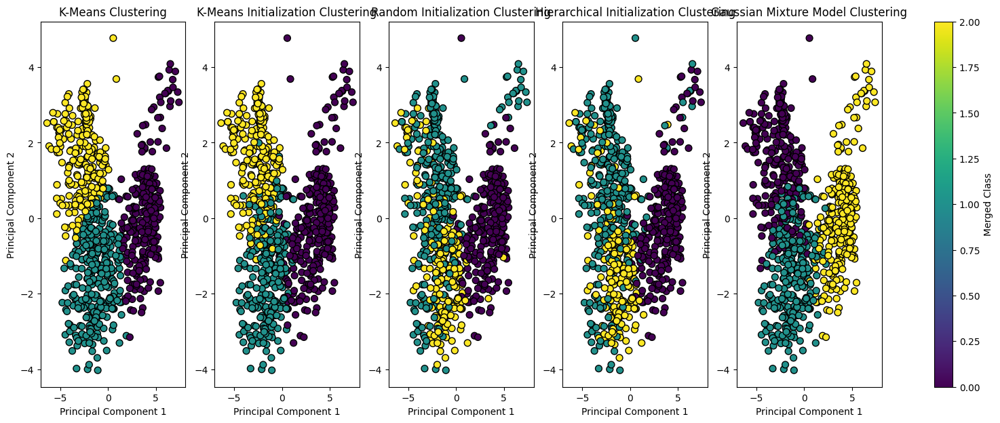

K-Means - ARI: 0.0964, NMI: 0.1148, Silhouette Score: 0.2919, Davies-Bouldin Index: 1.3090
K-Means Initialization - ARI: 0.1213, NMI: 0.1149, Silhouette Score: 0.2544, Davies-Bouldin Index: 1.3996
Random Initialization - ARI: 0.1208, NMI: 0.1283, Silhouette Score: 0.1624, Davies-Bouldin Index: 2.5582
Hierarchical Initialization - ARI: 0.1069, NMI: 0.1194, Silhouette Score: 0.2071, Davies-Bouldin Index: 2.1643
Gaussian Mixture Model - ARI: 0.1147, NMI: 0.1305, Silhouette Score: 0.2703, Davies-Bouldin Index: 1.4032


In [ ]:
# Prepare data for clustering
X = scaled_data.drop('Merged_Class', axis=1).values
y_true = scaled_data['Merged_Class'].values

# Perform PCA on the data for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Number of clusters
n_clusters = 3

# Define methods
methods = {
    'K-Means': lambda X, n_clusters: KMeans(n_clusters=n_clusters, random_state=42, n_init=10, init='k-means++').fit_predict(X),
    'K-Means Initialization': em_kmeans_init,
    'Random Initialization': em_random_init,
    'Hierarchical Initialization': em_hierarchical_init,
    'Gaussian Mixture Model': gmm_clustering
}

# Apply and evaluate each method
results = {}
fig, axes = plt.subplots(1, len(methods), figsize=(20, 7))

for idx, (method_name, method) in enumerate(methods.items()):
    print(f'Evaluating {method_name}...')
    if method_name == 'K-Means':
        y_pred = method(X, n_clusters)
    elif method_name == 'Gaussian Mixture Model':
        y_pred = method(X, n_clusters)
    else:
        pcas, weights, y_pred = method(X, n_clusters)

    ari, nmi, silhouette, db = evaluate_clustering(y_true, y_pred)
    results[method_name] = {'ARI': ari, 'NMI': nmi, 'Silhouette': silhouette, 'DB': db}

    sc = visualize_clusters_2d(X_pca, y_pred, method_name, axes[idx])

# Add colorbar
fig.colorbar(sc, ax=axes, orientation='vertical', label='Merged Class')

plt.show()

# Print all metrics together
for method_name, metrics in results.items():
    print_metrics(method_name, metrics)

#### **Clustering metrics:**
1. **Adjusted Rand Index (ARI)**: Measures the similarity between the true labels and the predicted labels, with a higher value indicating better clustering.
2. **Normalized Mutual Information (NMI)**: Measures the mutual dependence between the true labels and the predicted labels, with a higher value indicating better clustering.
3. **Silhouette Score**: Measures how similar an object is to its own cluster compared to other clusters, with a higher value indicating better clustering.
4. **Davies-Bouldin Index (DB)**: Measures the average similarity ratio of each cluster with the one that is most similar to it, with a lower value indicating better clustering.

#### **Evaluation results**
- **K-Means**: Offers the best silhouette score and DB index, but has lower ARI and NMI compared to some other methods.
- **K-Means Initialization**: Shows the best ARI and a good DB index.
- **Random Initialization**: Provides high ARI and NMI but poor silhouette score and DB index, suggesting the clusters are not as well-defined.
- **Hierarchical Initialization**: Generally performs worse across most metrics, indicating less effective clustering.
- **Gaussian Mixture Model**: Has high NMI and a good silhouette score.
-All methods showed poor clustering performance based on ARI and NMI, showing minimal agreement and correlation with real labels.

#### **General Observations**
- **Effectiveness**: The combination of EM and PCA shows varying levels of effectiveness depending on the initialization method used.
- **Initialization Matters**: The choice of initialization method significantly impacts the performance of the EM-PCA combination, as evidenced by the varying metrics.


####Compare the effectiveness of Kernel PCA with EM algorithm (using K-Means initialization) against standard K-Means clustering on a given dataset.

Converged at iteration 5
Kernel PCA with EM (K-Means Init) - ARI: 0.1052, NMI: 0.1126, Silhouette Score: 0.2858, Davies-Bouldin Index: 1.3059


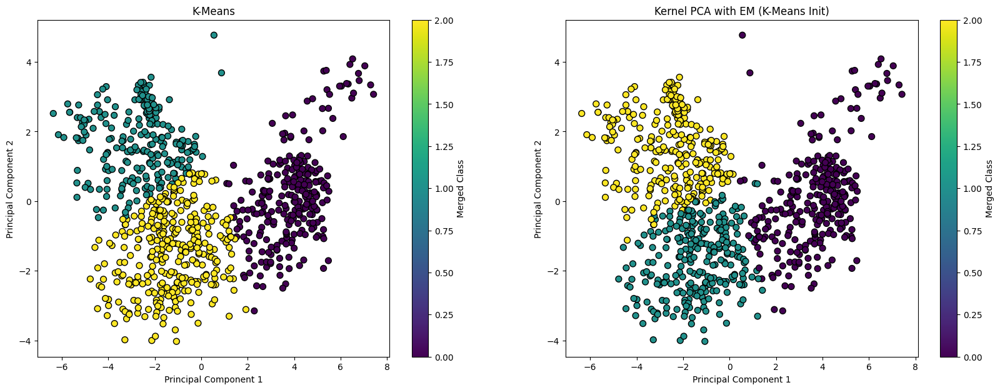

In [ ]:
# Prepare data for clustering
X = scaled_data.drop('Merged_Class', axis=1).values
y_true = scaled_data['Merged_Class'].values

# Perform PCA on the data for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Number of clusters
n_clusters = 3

# Function for Kernel PCA with EM
def kernel_pca_em_kmeans_init(X, n_clusters, kernel='rbf', max_iter=100, tol=1e-4):
    # Step 1: Perform Kernel PCA
    kpca = KernelPCA(n_components=3, kernel=kernel, fit_inverse_transform=True, random_state=42)
    X_kpca = kpca.fit_transform(X)

    # Step 2: Initialize clusters using K-Means
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10, init='k-means++')
    y_kmeans_pred = kmeans.fit_predict(X_kpca)
    cluster_centers = kmeans.cluster_centers_

    # Step 3: Apply EM Algorithm on the Kernel PCA-transformed data
    pcas, weights, y_pred = em_pca(X_kpca, cluster_centers, n_clusters, max_iter, tol)

    return pcas, weights, y_pred, X_kpca

# Apply Kernel PCA clustering
pcas, weights, y_pred, X_kpca = kernel_pca_em_kmeans_init(X, n_clusters)

# Evaluate the clustering results
ari, nmi, silhouette, db = evaluate_clustering(y_true, y_pred)

# Print metrics
print(f'Kernel PCA with EM (K-Means Init) - ARI: {ari:.4f}, NMI: {nmi:.4f}, Silhouette Score: {silhouette:.4f}, Davies-Bouldin Index: {db:.4f}')

# Visualize Clusters
fig, axes = plt.subplots(1, 2, figsize=(20, 7))

# K-Means
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10, init='k-means++')
y_kmeans = kmeans.fit_predict(X_pca)
sc_kmeans = visualize_clusters_2d(X_pca, y_kmeans, 'K-Means', axes[0])

# Kernel PCA with EM
sc_em = visualize_clusters_2d(X_pca, y_pred, 'Kernel PCA with EM (K-Means Init)', axes[1])

# Add colorbar
fig.colorbar(sc_kmeans, ax=axes[0], orientation='vertical', label='Merged Class')
fig.colorbar(sc_em, ax=axes[1], orientation='vertical', label='Merged Class')

plt.show()

####Find the optimal epsilon value for the DBSCAN (Density-Based Spatial Clustering of Applications with Noise) algorithm and evaluate the clustering performance using several metrics

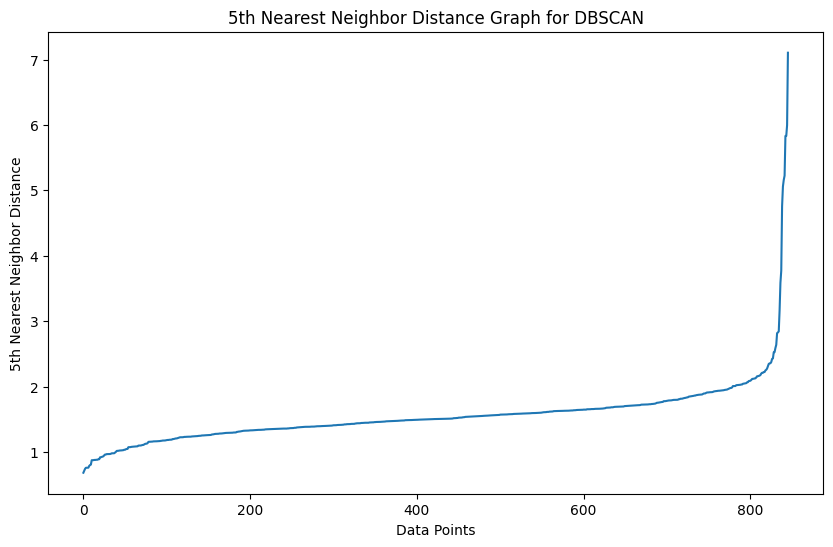

Optimal epsilon value: 6.00
DBSCAN (Optimal Epsilon) - ARI: 0.0086, NMI: 0.0151, Silhouette Score: 0.6175, Davies-Bouldin Index: 0.5853


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

# Find the optimal epsilon value for DBSCAN
nearest_neighbors = NearestNeighbors(n_neighbors=5)
neighbors = nearest_neighbors.fit(X)
distances, indices = neighbors.kneighbors(X)
distances = np.sort(distances[:, 4], axis=0)
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.xlabel('Data Points')
plt.ylabel('5th Nearest Neighbor Distance')
plt.title('5th Nearest Neighbor Distance Graph for DBSCAN')
plt.show()

# Choose an epsilon value where the slope of the curve changes the most (elbow point)
optimal_eps = distances[np.argmax(np.diff(distances))]
print(f'Optimal epsilon value: {optimal_eps:.2f}')

# Perform DBSCAN with the optimal epsilon value
dbscan = DBSCAN(eps=optimal_eps, min_samples=5)
y_dbscan_pred = dbscan.fit_predict(X)

# Evaluate DBSCAN clustering with the optimal epsilon
ari_dbscan = adjusted_rand_score(y_true, y_dbscan_pred)
nmi_dbscan = normalized_mutual_info_score(y_true, y_dbscan_pred)
silhouette_dbscan = silhouette_score(X, y_dbscan_pred) if len(set(y_dbscan_pred)) > 1 else -1
db_dbscan = davies_bouldin_score(X, y_dbscan_pred) if len(set(y_dbscan_pred)) > 1 else -1

print(f'DBSCAN (Optimal Epsilon) - ARI: {ari_dbscan:.4f}, NMI: {nmi_dbscan:.4f}, Silhouette Score: {silhouette_dbscan:.4f}, Davies-Bouldin Index: {db_dbscan:.4f}')


####Use of Kernel Principal Component Analysis (Kernel PCA) combined with clustering techniques (K-Means and the EM algorithm) to cluster a given dataset

In [ ]:
from sklearn.decomposition import KernelPCA

def kernel_pca_clustering(X, y_true, n_clusters, kernel='rbf'):
    kpca = KernelPCA(n_components=3, kernel=kernel)
    X_kpca = kpca.fit_transform(X)

    # Apply K-Means on Kernel PCA transformed data
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    y_kmeans_pred = kmeans.fit_predict(X_kpca)

    # Apply EM Algorithm with Kernel PCA
    cluster_centers = kmeans.cluster_centers_
    pcas, weights, y_em_pred = em_pca(X_kpca, cluster_centers, n_clusters)

    # Evaluate the clustering results
    ari_kmeans = adjusted_rand_score(y_true, y_kmeans_pred)
    nmi_kmeans = normalized_mutual_info_score(y_true, y_kmeans_pred)
    silhouette_kmeans = silhouette_score(X_kpca, y_kmeans_pred)
    db_kmeans = davies_bouldin_score(X_kpca, y_kmeans_pred)

    ari_em = adjusted_rand_score(y_true, y_em_pred)
    nmi_em = normalized_mutual_info_score(y_true, y_em_pred)
    silhouette_em = silhouette_score(X_kpca, y_em_pred)
    db_em = davies_bouldin_score(X_kpca, y_em_pred)

    print(f'Kernel PCA (K-Means) - ARI: {ari_kmeans:.4f}, NMI: {nmi_kmeans:.4f}, Silhouette Score: {silhouette_kmeans:.4f}, Davies-Bouldin Index: {db_kmeans:.4f}')
    print(f'Kernel PCA (EM) - ARI: {ari_em:.4f}, NMI: {nmi_em:.4f}, Silhouette Score: {silhouette_em:.4f}, Davies-Bouldin Index: {db_em:.4f}')

# Apply Kernel PCA clustering
kernel_pca_clustering(X, y_true, n_clusters)


Converged at iteration 5
Kernel PCA (K-Means) - ARI: 0.0959, NMI: 0.1085, Silhouette Score: 0.4723, Davies-Bouldin Index: 0.8870
Kernel PCA (EM) - ARI: 0.1052, NMI: 0.1126, Silhouette Score: 0.4654, Davies-Bouldin Index: 0.8872


## **Autoencoder**

### Introduction about Autoencoder



Autoencoder is a type of artificial neural network used primarily for unsupervised learning of efficient codings of input data. The goal of an Autoencoder is to learn a compressed representation (encoding) for a set of data, typically for the purpose of dimensionality reduction or feature learning. The Autoencoder network is trained to encode the input data into a lower-dimensional representation and then decode it back to a reconstruction that closely matches the original input data

An Autoencoder consists of two main parts:
- **Encoder:** This part of the network compresses the input into a latent-space representation. It consists of one or more layers of neurons, and its job is to map the input data to a lower-dimensional space
- **Decoder:** This part of the network reconstructs the input data from the compressed representation. It also consists of one or more layers of neurons and maps the lower-dimensional encoded data back to the original input space

**Construction (Reconstruction) Loss** measures the discrepancy between the original input data (X) and the reconstructed data (X') generated by the decoder. The goal is to minimize this loss by adjusting the weights and biases of the autoencoder

Formula:
$$\text{MSE} = \frac{1}{N} \sum_{i=1}^{N} \| \mathbf{X}_i - \hat{\mathbf{X}}_i \|^2$$
where:
- $N$: Number of data points in the training set
- $X_i$: Original input data for data point i (vector)
- $\hat{X}_i$: Reconstructed version of $X_i$ (vector)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error
import random

# Set random seed for reproducibility
random_seed = 42
torch.manual_seed(random_seed)
np.random.seed(random_seed)

In [ ]:
# Convert your DataFrame to a NumPy array and then to a PyTorch tensor
X = scaled_data.drop('Merged_Class', axis=1).values
X = torch.tensor(X, dtype=torch.float32)

Simple Autoencoder - Epoch [50/500], Loss: 0.3502
Simple Autoencoder - Epoch [100/500], Loss: 0.2208
Simple Autoencoder - Epoch [150/500], Loss: 0.2042
Simple Autoencoder - Epoch [200/500], Loss: 0.2032
Simple Autoencoder - Epoch [250/500], Loss: 0.2030
Simple Autoencoder - Epoch [300/500], Loss: 0.2029
Simple Autoencoder - Epoch [350/500], Loss: 0.2029
Simple Autoencoder - Epoch [400/500], Loss: 0.2029
Simple Autoencoder - Epoch [450/500], Loss: 0.2029
Simple Autoencoder - Epoch [500/500], Loss: 0.2028


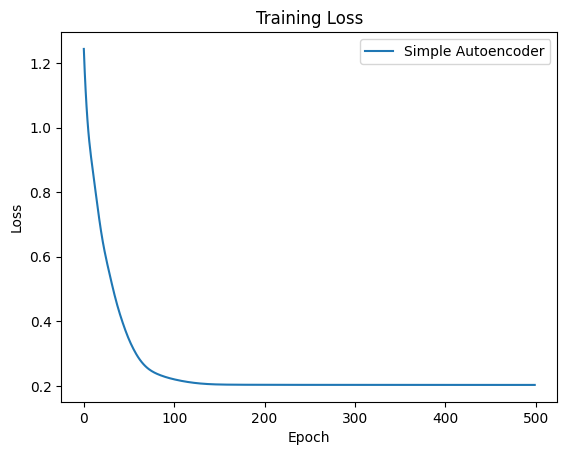

In [ ]:
# Define the Simple Autoencoder class without orthogonal constraint
class SimpleAutoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(SimpleAutoencoder, self).__init__()
        self.encoder = nn.Linear(input_dim, latent_dim)
        self.decoder = nn.Linear(latent_dim, input_dim)

    def forward(self, x):
        z = self.encoder(x)
        x_reconstructed = self.decoder(z)
        return x_reconstructed

# Set dimensions
input_dim = X.shape[1]
latent_dim = 3  # Number of principal components

# Create the simple autoencoder model, loss function, and optimizer
simple_model = SimpleAutoencoder(input_dim, latent_dim)
criterion = nn.MSELoss()
optimizer = optim.Adam(simple_model.parameters(), lr=0.01)

# Train the Simple Autoencoder
num_epochs = 500
simple_losses = []

for epoch in range(num_epochs):
    optimizer.zero_grad()
    outputs = simple_model(X)
    loss = criterion(outputs, X)
    loss.backward()
    optimizer.step()
    simple_losses.append(loss.item())

    if (epoch+1) % 50 == 0:
        print(f'Simple Autoencoder - Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

# Plot the training loss
plt.plot(simple_losses, label='Simple Autoencoder')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()
plt.show()

In [ ]:
# Get the encoded (latent) representation for Simple Autoencoder
with torch.no_grad():
    simple_encoded_data = simple_model.encoder(X).numpy()
    simple_decoded_data = simple_model.decoder(torch.tensor(simple_encoded_data, dtype=torch.float32)).numpy()

# Calculate and print the reconstruction loss for the Simple Autoencoder
reconstruction_loss_simple_autoencoder = mean_squared_error(X.numpy(), simple_decoded_data)
print(f'Reconstruction Loss for Simple Autoencoder: {reconstruction_loss_simple_autoencoder:.4f}')

# Calculate the variance captured by the latent representation (encoded data)
captured_variance_simple = np.var(simple_encoded_data, axis=0).sum()

# Calculate the total variance in the original data
total_variance = np.var(X.numpy(), axis=0).sum()

# Calculate and print the explained variance ratio for Simple Autoencoder
explained_variance_ratio_simple_autoencoder = captured_variance_simple / total_variance
print(f'Explained Variance Ratio for Simple Autoencoder: {explained_variance_ratio_simple_autoencoder:.4f}')

Reconstruction Loss for Simple Autoencoder: 0.2028
Explained Variance Ratio for Simple Autoencoder: 0.3384


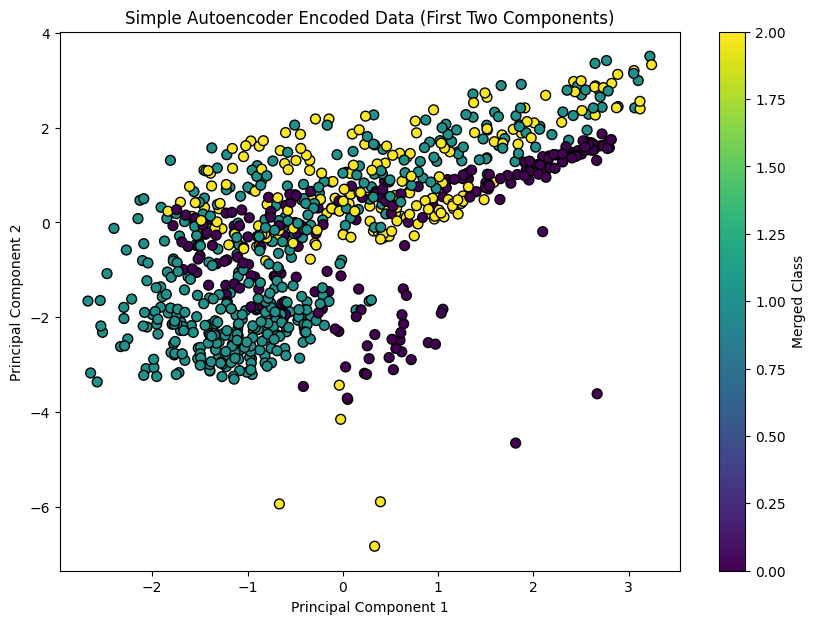

In [ ]:
# Visualize the encoded data in 2D for Simple Autoencoder
plt.figure(figsize=(10, 7))
plt.scatter(simple_encoded_data[:, 0], simple_encoded_data[:, 1], c=scaled_data['Merged_Class'], cmap='viridis', edgecolor='k', s=50)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Simple Autoencoder Encoded Data (First Two Components)')
plt.colorbar(label='Merged Class')
plt.show()

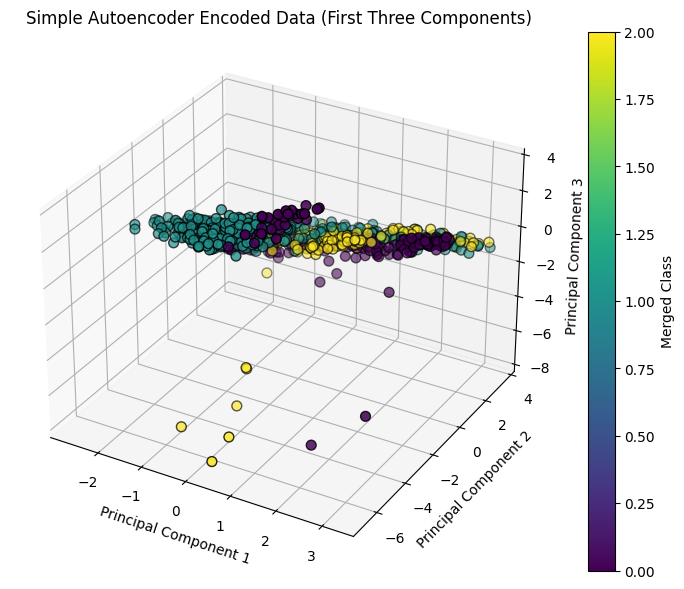

In [ ]:
# 3D Plot for the first three principal components for Simple Autoencoder
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(simple_encoded_data[:, 0], simple_encoded_data[:, 1], simple_encoded_data[:, 2], c=scaled_data['Merged_Class'], cmap='viridis', edgecolor='k', s=50)
plt.colorbar(sc, label='Merged Class')
ax.set_title('Simple Autoencoder Encoded Data (First Three Components)')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.show()

### Steps to make Autoencoder mimic PCA

**1. Linear Activation Functions:** Use linear activation functions for both the encoder and the decoder layers $\rightarrow$ Ensures the transformations applied by the autoencoder are linear, similar to PCA.

**2. Single Hidden Layer:** Use a single hidden layer for both the encoder and the decoder $\rightarrow$ PCA essentially finds a linear subspace that best represents the data, which corresponds to a single layer of transformation.

**3. Orthogonality Constraint:** Impose an orthogonality constraint on the weight matrix of the encoder $\rightarrow$ In PCA, the principal components are orthogonal to each other. Adding a regularization term to the loss function can penalize deviations from orthogonality, encouraging the autoencoder to learn orthogonal transformations.

**Construction (Reconstruction) Loss** fomula:
$$\mathcal{L} = \frac{1}{N} \sum_{i=1}^{N} \| \mathbf{X}_i - \hat{\mathbf{X}}_i \|^2 + \lambda \| \mathbf{W}_e^\top \mathbf{W}_e - \mathbf{I} \|^2 $$
where:
- $N$: Number of data points in the training set
- $X_i$: Original input data for data point i (vector)
- $\hat{X}_i$: Reconstructed version of $X_i$ (vector)
- $λ$: Regularization hyperparameter (controls strength of the term)
- $W_e$: Encoder weight matrix
- $W_e^T$: Transpose of $W_e$
- $I$: Identity matrix (same size as $W_e$)

In [ ]:
# # Set random seed for reproducibility
random_seed = 42
torch.manual_seed(random_seed)
np.random.seed(random_seed)

# Convert your DataFrame to a NumPy array and then to a PyTorch tensor
X = scaled_data.drop('Merged_Class', axis=1).values
X = torch.tensor(X, dtype=torch.float32)

Epoch [50/500], Loss: 0.3918
Epoch [100/500], Loss: 0.2399
Epoch [150/500], Loss: 0.2175
Epoch [200/500], Loss: 0.2107
Epoch [250/500], Loss: 0.2100
Epoch [300/500], Loss: 0.2083
Epoch [350/500], Loss: 0.2078
Epoch [400/500], Loss: 0.2077
Epoch [450/500], Loss: 0.2066
Epoch [500/500], Loss: 0.2067


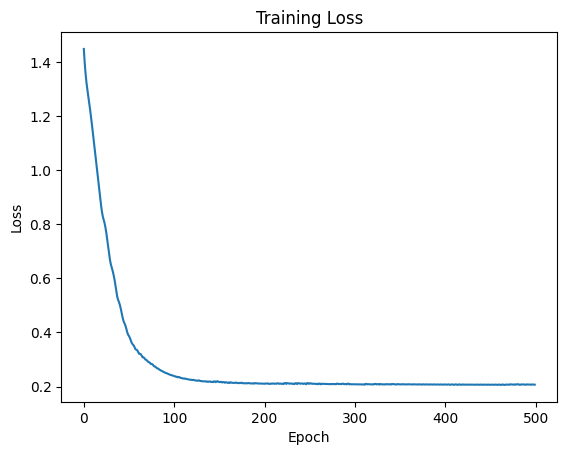

In [ ]:
# Define the PCA Autoencoder class with orthogonal constraint
class PCA_Autoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(PCA_Autoencoder, self).__init__()
        self.encoder = nn.Linear(input_dim, latent_dim, bias=False)
        self.decoder = nn.Linear(latent_dim, input_dim, bias=False)

    def forward(self, x):
        z = self.encoder(x)
        x_reconstructed = self.decoder(z)
        return x_reconstructed

# Orthogonal regularization function
def orthogonal_regularization(matrix):
    I = torch.eye(matrix.size(0), device=matrix.device)
    dot_product = torch.mm(matrix, matrix.t())
    reg = torch.norm(dot_product - I)
    return reg

# Set dimensions
input_dim = X.shape[1]
latent_dim = 3  # Number of principal components

# Create the model, loss function, and optimizer
model = PCA_Autoencoder(input_dim, latent_dim)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)

# Train the Autoencoder
num_epochs = 500
losses = []

for epoch in range(num_epochs):
    optimizer.zero_grad()
    outputs = model(X)
    loss = criterion(outputs, X)
    ortho_reg = orthogonal_regularization(model.encoder.weight)
    loss += 0.3 * ortho_reg  # Add orthogonal regularization term
    loss.backward()
    optimizer.step()
    losses.append(loss.item())

    if (epoch+1) % 50 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

# Plot the training loss
plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()


Reconstruction Loss for Autoencoder: 0.2047
Explained Variance Ratio for Autoencoder: 0.5730


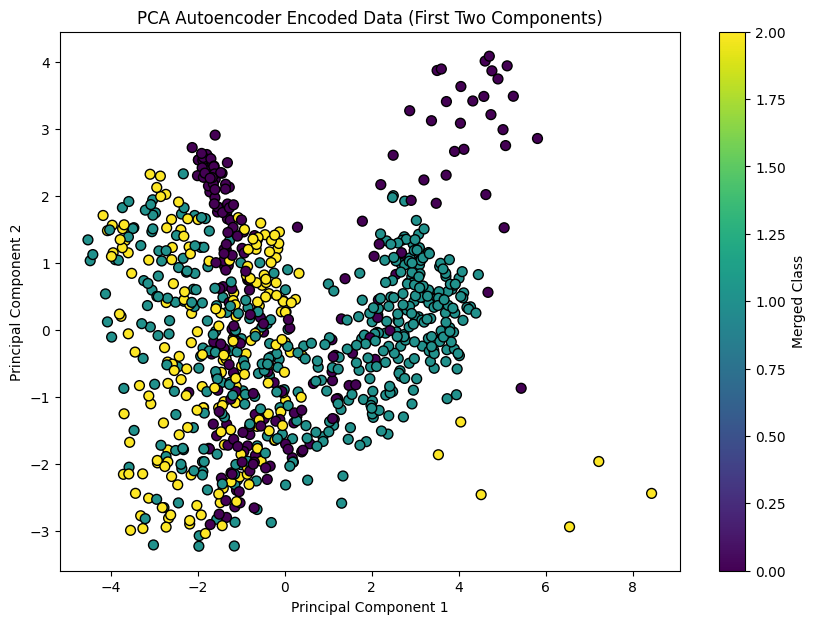

In [ ]:
# Get the encoded (latent) representation
with torch.no_grad():
    encoded_data = model.encoder(X).numpy()
    decoded_data = model.decoder(torch.tensor(encoded_data, dtype=torch.float32)).numpy()

# Calculate and print the reconstruction loss for the Autoencoder
reconstruction_loss_autoencoder = mean_squared_error(X.numpy(), decoded_data)
print(f'Reconstruction Loss for Autoencoder: {reconstruction_loss_autoencoder:.4f}')

# Calculate the total variance in the original data
total_variance = np.var(X.numpy(), axis=0).sum()

# Calculate the variance captured by the latent representation (encoded data)
captured_variance_autoencoder = np.var(encoded_data, axis=0).sum()

# Calculate and print the explained variance ratio
explained_variance_ratio_autoencoder = captured_variance_autoencoder / total_variance
print(f'Explained Variance Ratio for Autoencoder: {explained_variance_ratio_autoencoder:.4f}')

# Visualize the encoded data in 2D
plt.figure(figsize=(10, 7))
plt.scatter(encoded_data[:, 0], encoded_data[:, 1], c=scaled_data['Merged_Class'], cmap='viridis', edgecolor='k', s=50)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Autoencoder Encoded Data (First Two Components)')
plt.colorbar(label='Merged Class')
plt.show()

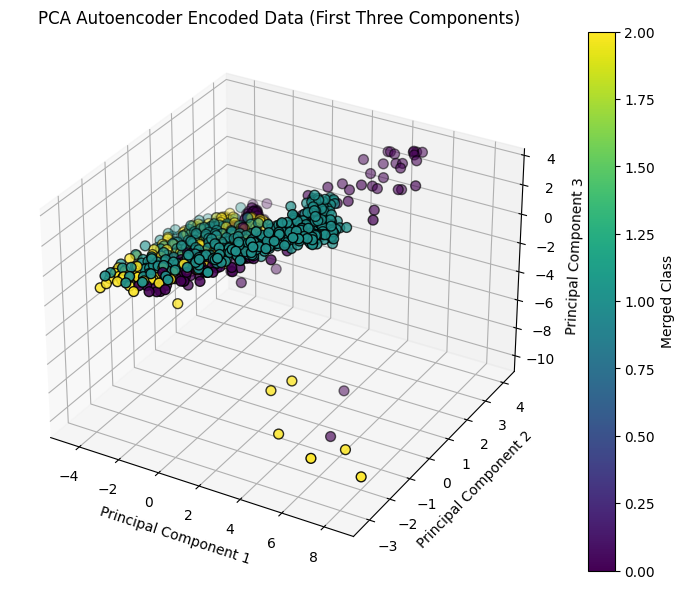

In [ ]:
# 3D Plot for the first three principal components
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(encoded_data[:, 0], encoded_data[:, 1], encoded_data[:, 2], c=scaled_data['Merged_Class'], cmap='viridis', edgecolor='k', s=50)
plt.colorbar(sc, label='Merged Class')
ax.set_title('PCA Autoencoder Encoded Data (First Three Components)')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.show()

### Evaluation results

- Explained Variance Ratio for PCA (3 components): 0.7972
- Explained Variance Ratio for Simple Autoencoder: 0.3384
- Explained Variance Ratio for Autoencoder: 0.5730

$\rightarrow$ **PCA** is effective for linear dimensionality reduction and provides high explained variance but is limited in capturing non-linear patterns. **Simple Autoencoder** can capture complex, non-linear patterns but requires careful tuning and is prone to overfitting. **PCA Autoencoder** strikes a balance by capturing more variance than the simple autoencoder while maintaining some linear interpretability through orthogonal constraints.


**1. Simple Autoencoder**
- Strong points:
 - Non-linear Representations: Can learn complex, non-linear mappings, capturing intricate patterns in data.
 - Flexibility: Adaptable to different types of data (images, text, etc.) and various tasks (denoising, anomaly detection, etc.).
 - Feature Learning: Learns useful features directly from raw data without manual feature extraction.
 - Dimensionality Reduction: Effectively reduces dimensionality while retaining essential information.
 - Denoising Capability: Denoising autoencoders can remove noise, improving input signal quality.
- Weak points:
 - Overfitting: Prone to overfitting, especially with complex models and insufficient training data.
 - Training Complexity: Computationally intensive and time-consuming, requiring careful hyperparameter tuning.
 - Interpretability: Learned features are often less interpretable compared to PCA.
 - Sensitivity to Hyperparameters: Performance highly depends on hyperparameter optimization.
 - Local Minima: Training can get stuck in local minima, leading to suboptimal solutions.

**2. PCA-Autoencoder**
- Strong points:
 - Linear Transformation: Ensures transformations are linear, making results easier to interpret.
 - Orthogonality: Produces orthogonal features similar to principal components, leading to uncorrelated features.
 - Dimensionality Reduction: Effectively reduces dimensionality, retaining most of the variance.
 - Simpler Training: Linear nature and single-layer structure simplify training compared to non-linear autoencoders.
- Weak points:
 - Limited to Linear Relationships: Can only capture linear relationships, missing complex non-linear patterns.
 - Overfitting with Orthogonality: Strict orthogonality constraints can lead to overfitting if not well-tuned.
 - Training Complexity with Constraints: Orthogonality constraints add complexity to training, requiring careful tuning of regularization parameters.
 - Interpretability vs. Flexibility: More interpretable but less flexible in capturing non-linear patterns.
 - Computationally Intensive: Training with orthogonality constraints can be computationally intensive for large datasets.

##**Summary Report**
####**Overview**
This project explores clustering and dimensionality reduction techniques using the Vehicle Silhouettes dataset. We evaluated the performance of different clustering methods combined with PCA and various autoencoder models for dimensionality reduction. The evaluation focused on understanding how different initialization methods and modeling approaches impact the results.

#### **Clustering Metrics**
* Adjusted Rand Index (ARI): Measures similarity between true and predicted labels. Higher values indicate better clustering.
* Normalized Mutual Information (NMI): Measures mutual dependence between true and predicted labels. Higher values indicate better clustering.
* Silhouette Score: Assesses how similar an object is to its own cluster compared to other clusters. Higher values indicate better clustering.
* Davies-Bouldin Index (DB): Evaluates average similarity ratio of each cluster with its most similar cluster. Lower values indicate better clustering.

#### **Evaluation Results**
* K-Means: Achieves the best silhouette score and DB index but has lower ARI and NMI.
* K-Means Initialization: Shows the best ARI and a good DB index.
* Random Initialization: Provides high ARI and NMI but has poor silhouette score and DB index.
* Hierarchical Initialization: Performs worse across most metrics, indicating less effective clustering.
* Gaussian Mixture Model: Exhibits high NMI and a good silhouette score.

$\rightarrow$ Overall, clustering performance based on ARI and NMI was poor, indicating minimal agreement with true labels.

#### **Key Observations**
* **Effectiveness of Initialization:** The choice of initialization method significantly impacts clustering performance, particularly for the EM-PCA combination.
* **PCA:** Effective for linear patterns with high explained variance but limited in capturing non-linear relationships.
* **Simple Autoencoder:** Capable of capturing complex, non-linear patterns but requires careful tuning and can be prone to overfitting.
* **PCA Autoencoder:** Provides a balance by capturing more variance than the simple autoencoder while maintaining some linear interpretability through orthogonal constraints.

#### **Conclusion**
* This project demonstrates the importance of selecting appropriate methods and initialization strategies for effective clustering and dimensionality reduction. The results highlight that while traditional methods like PCA are robust for linear patterns, advanced methods like autoencoders offer significant advantages for capturing non-linear relationships.

* The combination of EM and PCA shows varying effectiveness depending on the initialization method, underscoring the critical role of proper initialization in clustering algorithms. For dimensionality reduction, PCA remains a strong baseline, but autoencoders, especially those with orthogonal constraints, provide a promising alternative for capturing more complex data structures.

* Future work could explore further optimization of these models and their applications to different types of datasets, aiming to enhance their generalizability and effectiveness in real-world scenarios. This analysis serves as a foundation for understanding the strengths and limitations of different clustering and dimensionality reduction techniques, guiding the development of more sophisticated machine learning models.